# Classifying images

## Import

In [13]:
import random
import numpy as np
from PIL import Image

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler, SubsetRandomSampler

from torchvision.transforms import Compose, Normalize, RandomHorizontalFlip, Resize, ToTensor

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline

In [14]:
torch.__version__

'2.7.1'

In [15]:
import torchvision
torchvision.__version__

'0.22.1'

## Carregar o Dataset (Intel Image Classification)

In [16]:
from torchvision import datasets, transforms
import os

data_dir = "./dataset/intel-image-classification"
train_dir = os.path.join(data_dir, "seg_train/seg_train")
test_dir = os.path.join(data_dir, "seg_test/seg_test")

print("Train directory:", train_dir)
print("Test directory:", test_dir)


transform_train = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

transform_test = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
])


train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
val_dataset = datasets.ImageFolder(test_dir, transform=transform_test)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


classes = train_dataset.classes
print("Classes:", classes)

Train directory: ./dataset/intel-image-classification/seg_train/seg_train
Test directory: ./dataset/intel-image-classification/seg_test/seg_test
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


## SimpleCNN Class

In [17]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),  # RGB = 3 canais
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 18 * 18, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.conv(x)
        x = self.fc(x)
        return x

## Architecture Class

In [20]:
class Architecture(object):
    def __init__(self, model, loss_fn, optimizer):
        # Here we define the attributes of our class

        # We start by storing the arguments as attributes
        # to use them later
        self.model = model
        self.loss_fn = loss_fn
        self.optimizer = optimizer
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        # Let's send the model to the specified device right away
        self.model.to(self.device)

        # These attributes are defined here, but since they are
        # not informed at the moment of creation, we keep them None
        self.train_loader = None
        self.val_loader = None

        # These attributes are going to be computed internally
        self.losses = []
        self.val_losses = []
        self.total_epochs = 0

        # Creates the train_step function for our model,
        # loss function and optimizer
        # Note: there are NO ARGS there! It makes use of the class
        # attributes directly
        self.train_step_fn = self._make_train_step_fn()
        # Creates the val_step function for our model and loss
        self.val_step_fn = self._make_val_step_fn()

    def to(self, device):
        # This method allows the user to specify a different device
        # It sets the corresponding attribute (to be used later in
        # the mini-batches) and sends the model to the device
        try:
            self.device = device
            self.model.to(self.device)
        except RuntimeError:
            self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
            print(f"Couldn't send it to {device}, sending it to {self.device} instead.")
            self.model.to(self.device)

    def set_loaders(self, train_loader, val_loader=None):
        # This method allows the user to define which train_loader (and val_loader, optionally) to use
        # Both loaders are then assigned to attributes of the class
        # So they can be referred to later
        self.train_loader = train_loader
        self.val_loader = val_loader

    def _make_train_step_fn(self):
        # This method does not need ARGS... it can refer to
        # the attributes: self.model, self.loss_fn and self.optimizer

        # Builds function that performs a step in the train loop
        def perform_train_step_fn(x, y):
            # Sets model to TRAIN mode
            self.model.train()

            # Step 1 - Computes our model's predicted output - forward pass
            yhat = self.model(x)
            # Step 2 - Computes the loss
            loss = self.loss_fn(yhat, y)
            # Step 3 - Computes gradients for both "a" and "b" parameters
            loss.backward()
            # Step 4 - Updates parameters using gradients and the learning rate
            self.optimizer.step()
            self.optimizer.zero_grad()

            # Returns the loss
            return loss.item()

        # Returns the function that will be called inside the train loop
        return perform_train_step_fn

    def _make_val_step_fn(self):
        # Builds function that performs a step in the validation loop
        def perform_val_step_fn(x, y):
            # Sets model to EVAL mode
            self.model.eval()

            # Step 1 - Computes our model's predicted output - forward pass
            yhat = self.model(x)
            # Step 2 - Computes the loss
            loss = self.loss_fn(yhat, y)
            # There is no need to compute Steps 3 and 4, since we don't update parameters during evaluation
            return loss.item()

        return perform_val_step_fn

    def _mini_batch(self, validation=False):
        # The mini-batch can be used with both loaders
        # The argument `validation`defines which loader and
        # corresponding step function is going to be used
        if validation:
            data_loader = self.val_loader
            step_fn = self.val_step_fn
        else:
            data_loader = self.train_loader
            step_fn = self.train_step_fn

        if data_loader is None:
            return None

        # Once the data loader and step function, this is the same
        # mini-batch loop we had before
        mini_batch_losses = []
        for x_batch, y_batch in data_loader:
            x_batch = x_batch.to(self.device)
            y_batch = y_batch.to(self.device)

            mini_batch_loss = step_fn(x_batch, y_batch)
            mini_batch_losses.append(mini_batch_loss)

        loss = np.mean(mini_batch_losses)
        return loss

    # this function was updated in this class
    def set_seed(self, seed=42):
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        torch.manual_seed(seed)
        np.random.seed(seed)
        random.seed(seed)
        try:
            self.train_loader.sampler.generator.manual_seed(seed)
        except AttributeError:
            pass

    def train(self, n_epochs, seed=42):
        # To ensure reproducibility of the training process
        self.set_seed(seed)

        for epoch in range(n_epochs):
            # Keeps track of the numbers of epochs
            # by updating the corresponding attribute
            self.total_epochs += 1

            # inner loop
            # Performs training using mini-batches
            loss = self._mini_batch(validation=False)
            self.losses.append(loss)

            # VALIDATION
            # no gradients in validation!
            with torch.no_grad():
                # Performs evaluation using mini-batches
                val_loss = self._mini_batch(validation=True)
                self.val_losses.append(val_loss)
            print(f"Epoch {epoch+1}/{n_epochs} | Train Loss: {loss:.4f} | Val Loss: {val_loss:.4f}", flush=True)

    def save_checkpoint(self, filename):
        # Builds dictionary with all elements for resuming training
        checkpoint = {'epoch': self.total_epochs,
                      'model_state_dict': self.model.state_dict(),
                      'optimizer_state_dict': self.optimizer.state_dict(),
                      'loss': self.losses,
                      'val_loss': self.val_losses}

        torch.save(checkpoint, filename)

    def load_checkpoint(self, filename):
        # Loads dictionary
        checkpoint = torch.load(filename)

        # Restore state for model and optimizer
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

        self.total_epochs = checkpoint['epoch']
        self.losses = checkpoint['loss']
        self.val_losses = checkpoint['val_loss']

        self.model.train() # always use TRAIN for resuming training

    def predict(self, x):
        # Set is to evaluation mode for predictions
        self.model.eval()
        # Takes aNumpy input and make it a float tensor
        x_tensor = torch.as_tensor(x).float()
        # Send input to device and uses model for prediction
        y_hat_tensor = self.model(x_tensor.to(self.device))
        # Set it back to train mode
        self.model.train()
        # Detaches it, brings it to CPU and back to Numpy
        return y_hat_tensor.detach().cpu().numpy()

    def count_parameters(self):
      return sum(p.numel() for p in self.model.parameters() if p.requires_grad)

    def plot_losses(self):
        fig = plt.figure(figsize=(10, 4))
        plt.plot(self.losses, label='Training Loss', c='b')
        plt.plot(self.val_losses, label='Validation Loss', c='r')
        plt.yscale('log')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.tight_layout()
        return fig

## Treinamento com Architecture

Epoch 1/10 | Train Loss: 0.9734 | Val Loss: 0.7282
Epoch 2/10 | Train Loss: 0.6660 | Val Loss: 0.6227
Epoch 3/10 | Train Loss: 0.5454 | Val Loss: 0.5730
Epoch 4/10 | Train Loss: 0.4748 | Val Loss: 0.5061
Epoch 5/10 | Train Loss: 0.4138 | Val Loss: 0.4813
Epoch 6/10 | Train Loss: 0.3587 | Val Loss: 0.5675
Epoch 7/10 | Train Loss: 0.3125 | Val Loss: 0.5139
Epoch 8/10 | Train Loss: 0.2614 | Val Loss: 0.5056
Epoch 9/10 | Train Loss: 0.2222 | Val Loss: 0.5974
Epoch 10/10 | Train Loss: 0.1851 | Val Loss: 0.5784


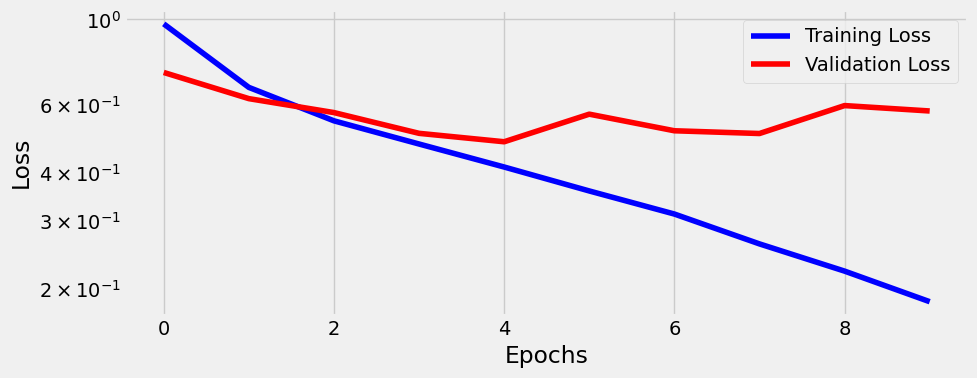

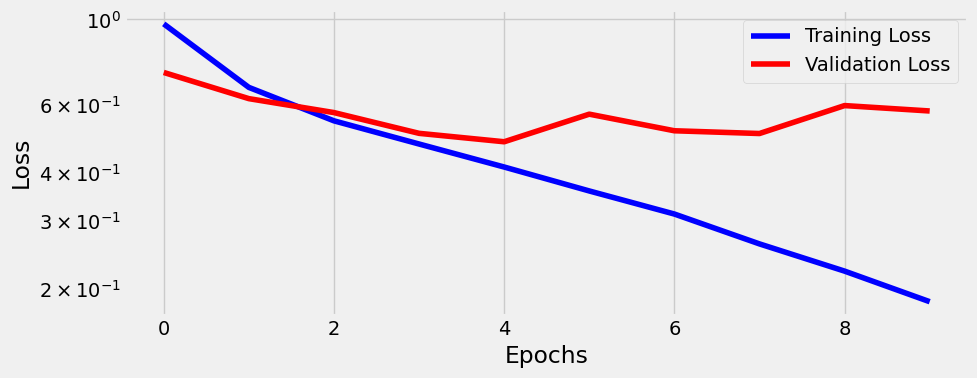

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SimpleCNN(num_classes=len(classes)).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()

trainer = Architecture(model, loss_fn, optimizer)
trainer.set_loaders(train_loader, val_loader)

trainer.train(n_epochs=10)
trainer.plot_losses()

## Matriz de Confusão

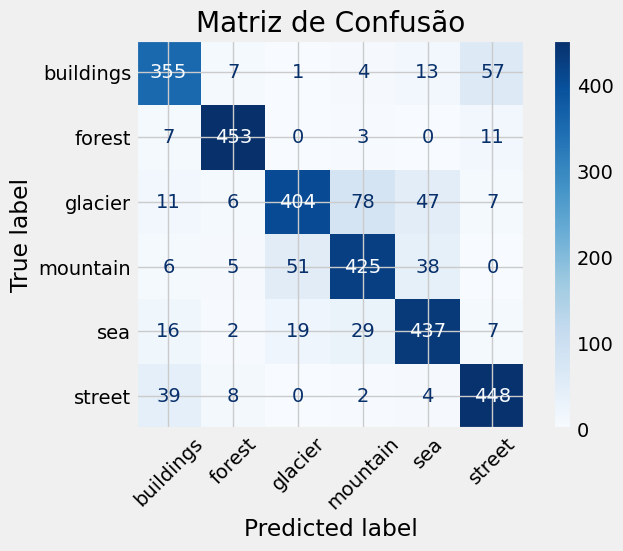

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def evaluate_model(model, loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for x_batch, y_batch in loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            outputs = model(x_batch)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title("Matriz de Confusão")
    plt.show()

evaluate_model(model, val_loader, device, classes)

## Visualização das previsões

In [37]:
def show_predictions_by_class(
    model,
    dataloader,
    device,
    class_names,
    n_per_class=8,
    mode="random",  # "random", "correct", "incorrect"
):
    import torch.nn.functional as F
    import matplotlib.patches as patches

    assert mode in ["random", "correct", "incorrect"], "Modo inválido. Use 'random', 'correct' ou 'incorrect'."

    model.eval()
    all_images, all_preds, all_labels, all_probs = [], [], [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)
            confs, preds = torch.max(probs, dim=1)

            all_images.append(images.cpu())
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
            all_probs.extend(confs.cpu().numpy())

    all_images = torch.cat(all_images)
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)

    fig, axes = plt.subplots(len(class_names), n_per_class, figsize=(n_per_class * 2.5, len(class_names) * 2.5))
    fig.suptitle(f"Modo: {mode.capitalize()} — {n_per_class} por classe", fontsize=16)

    for cls_idx, cls_name in enumerate(class_names):
        idxs = np.where(all_labels == cls_idx)[0]

        if mode == "correct":
            idxs = idxs[all_preds[idxs] == all_labels[idxs]]
        elif mode == "incorrect":
            idxs = idxs[all_preds[idxs] != all_labels[idxs]]

        if len(idxs) == 0:
            print(f"Aviso: Nenhuma amostra encontrada para classe '{cls_name}' no modo '{mode}'.")
            continue

        selected_idxs = (
            np.random.choice(idxs, n_per_class, replace=(len(idxs) < n_per_class))
        )
        sorted_idxs = selected_idxs[np.argsort(-all_probs[selected_idxs])]

        for j, i in enumerate(sorted_idxs):
            img = all_images[i].permute(1, 2, 0).numpy()
            true_label = class_names[all_labels[i]]
            pred_label = class_names[all_preds[i]]
            prob = all_probs[i]
            correct = true_label == pred_label

            ax = axes[cls_idx, j] if len(class_names) > 1 else axes[j]
            ax.imshow(img)
            ax.set_title(f"Img: {i}\nT: {true_label} P: {pred_label}\n{prob:.2%}", fontsize=8)
            ax.axis('off')

            edge_color = 'green' if correct else 'red'
            rect = patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                                     linewidth=4, edgecolor=edge_color, facecolor='none')
            ax.add_patch(rect)

    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()


### Visualização: Amostra Aleatória - 8 por classe

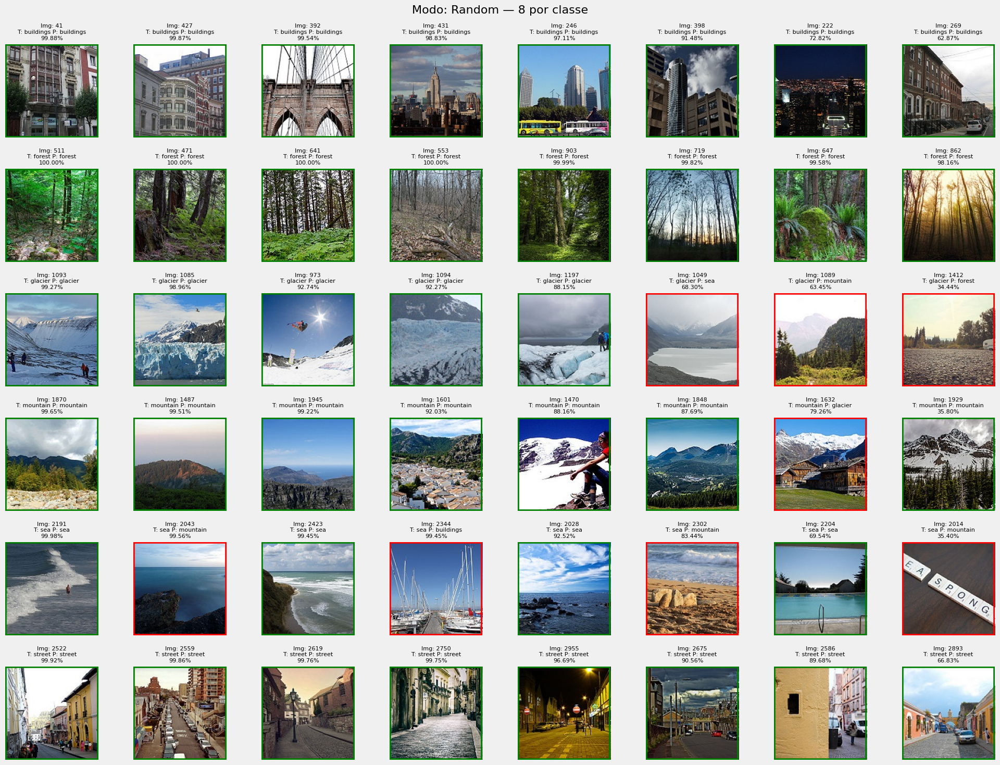

In [42]:
show_predictions_by_class(model, val_loader, device, classes, n_per_class=8, mode="random")

### Visualização: Amostra de Acertos - 8 por classe

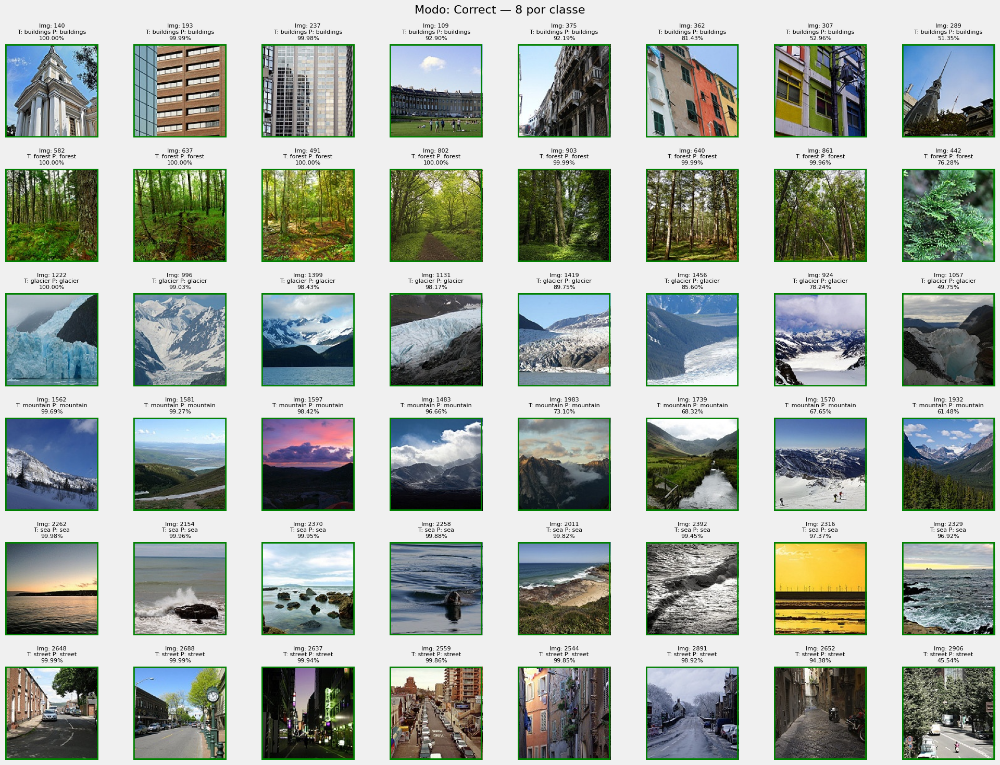

In [39]:
show_predictions_by_class(model, val_loader, device, classes, n_per_class=8, mode="correct")

### Visualização: Amostra de Erros - 8 por classe

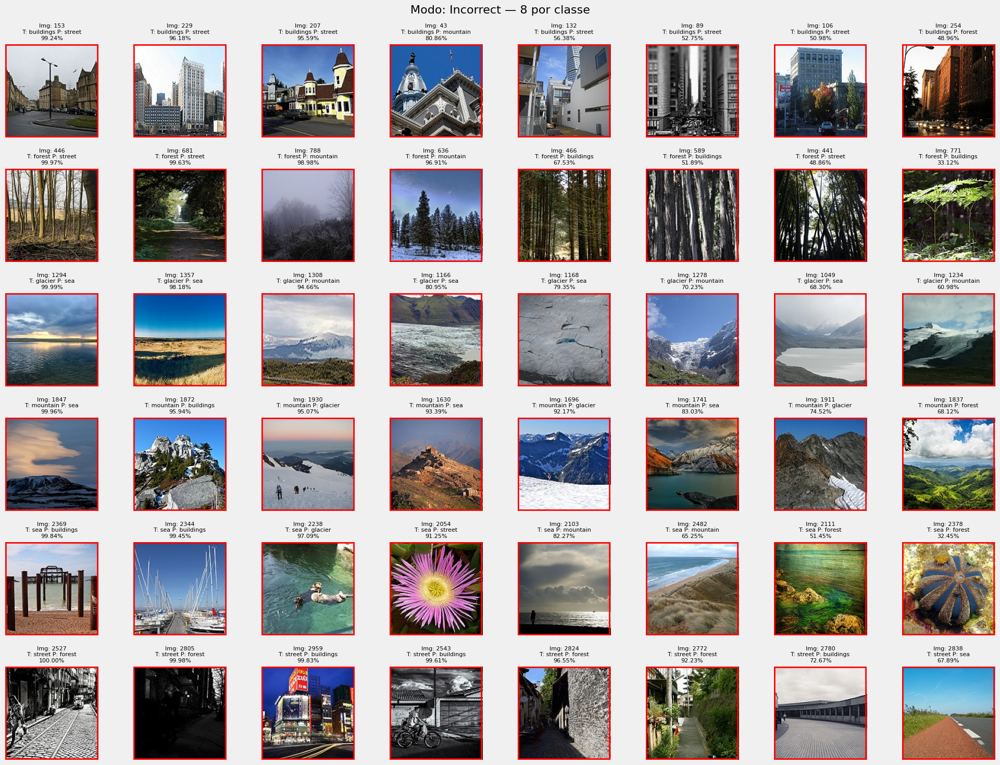

In [40]:
show_predictions_by_class(model, val_loader, device, classes, n_per_class=8, mode="incorrect")

## Hooks — visualizando ativações intermediárias

In [ ]:
def show_intermediate_activations_from_batch(
    model,
    x_batch,
    sample_idx=0,
    device='cpu',
    layer_name='conv2',
    max_filters=24,
    sort_by_mean=True
):
    # Ativações
    activations.clear()

    # Registrar hooks
    model.conv[0].register_forward_hook(get_activation('conv1'))
    model.conv[3].register_forward_hook(get_activation('conv2'))
    model.conv[6].register_forward_hook(get_activation('conv3'))

    # Forward
    model(x_batch.to(device))

    act = activations[layer_name][sample_idx]  # [C, H, W]

    # Estatísticas
    means = act.mean(dim=(1, 2))
    stds = act.std(dim=(1, 2))
    sorted_idx = torch.argsort(means, descending=True) if sort_by_mean else torch.arange(act.shape[0])
    num_filters = min(max_filters, act.shape[0])
    n_cols = 8
    n_rows = int(np.ceil(num_filters / n_cols))

    # Ativações
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2.2, n_rows * 2.8))
    fig.suptitle(f"Ativações da {layer_name} (imagem {sample_idx})", fontsize=16)

    for i in range(num_filters):
        idx = sorted_idx[i]
        ax = axes[i // n_cols, i % n_cols] if n_rows > 1 else axes[i]
        ax.imshow(act[idx].cpu(), cmap='viridis')
        ax.set_title(f"F{i} μ={means[idx]:.2f} σ={stds[idx]:.2f}", fontsize=8)
        ax.axis('off')

    # Esconde extras
    for j in range(num_filters, n_cols * n_rows):
        ax = axes[j // n_cols, j % n_cols] if n_rows > 1 else axes[j]
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

### Ativações da Convolução - Ordenadas por Média [IMG 8]

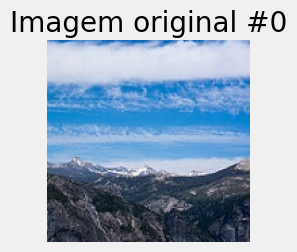

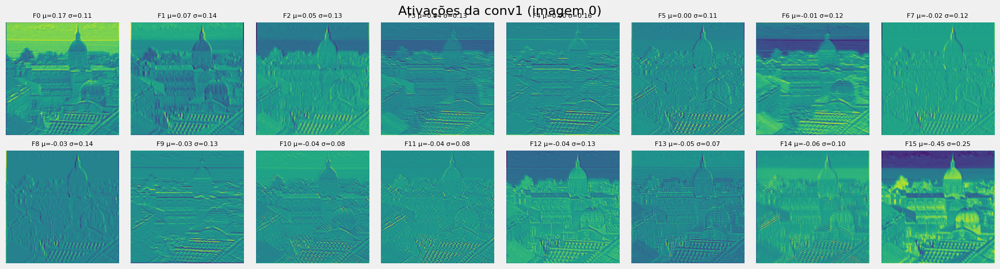

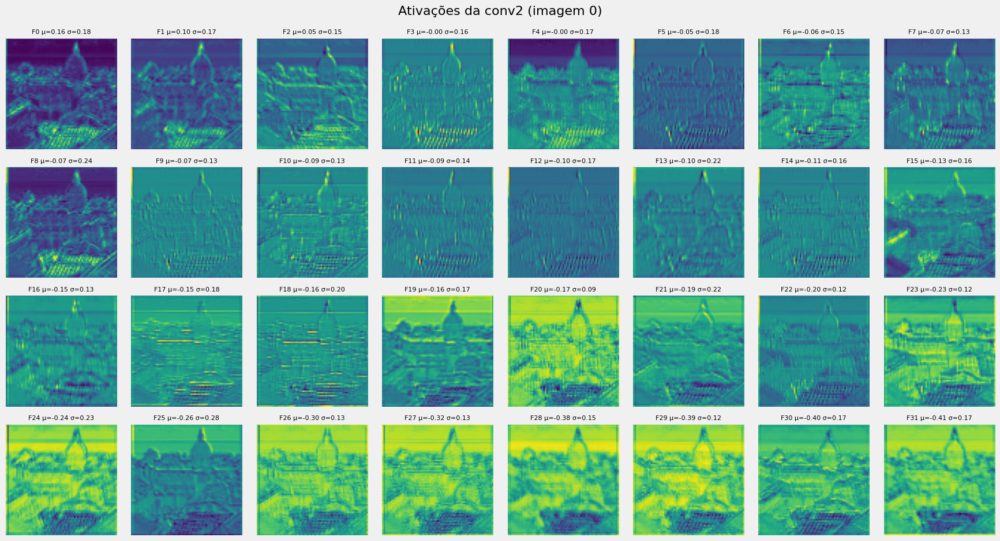

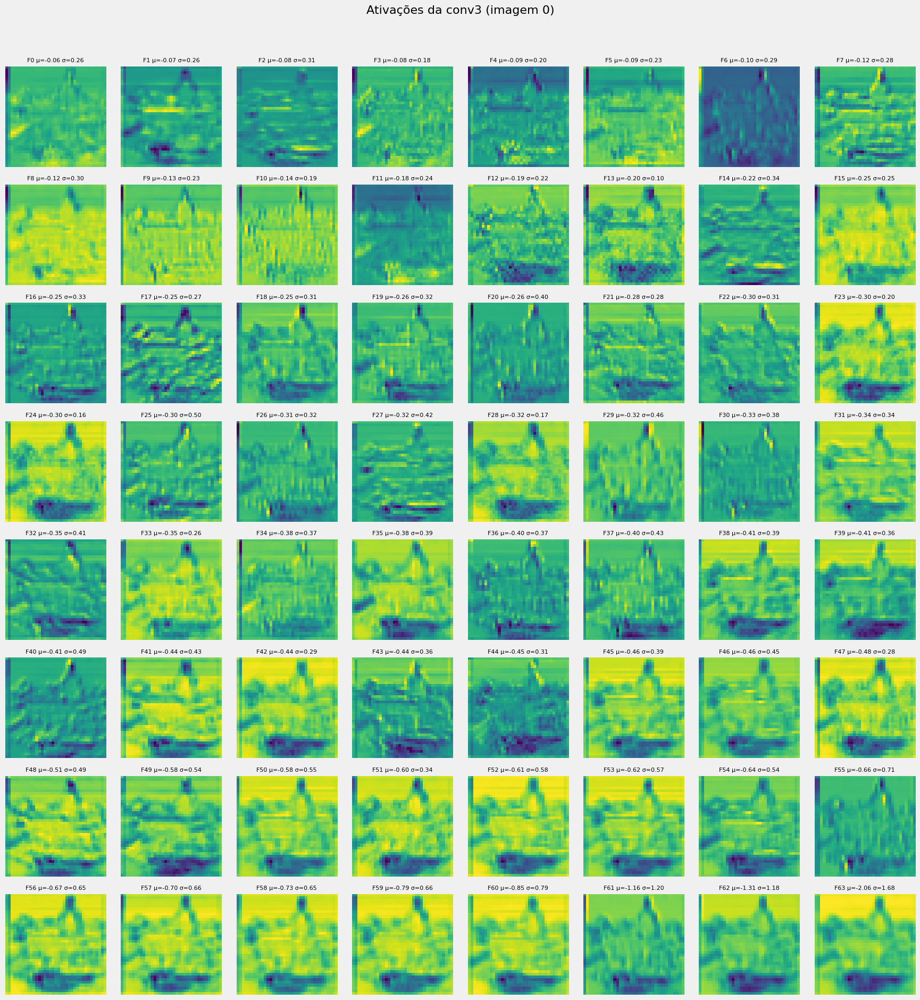

In [86]:
sample_idx = 0
x_batch_fixed, _ = next(iter(train_loader))
img = x_batch[sample_idx].permute(1, 2, 0).cpu().numpy()

plt.figure(figsize=(2.5, 2.5))
plt.imshow(img)
plt.title(f"Imagem original #{sample_idx}")
plt.axis('off')
plt.show()

for layer in ['conv1', 'conv2', 'conv3']:
    show_intermediate_activations_from_batch(
        model=model,
        x_batch=x_batch_fixed,
        sample_idx=sample_idx,
        device=device,
        layer_name=layer,
        max_filters=activations[layer].shape[1],
        sort_by_mean=True
    )
